In [1]:
# import libraries
from sklearn.datasets import make_classification
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.models import Model, load_model
from keras.layers import Input, Dense, LeakyReLU, ReLU, BatchNormalization, UpSampling2D, Conv2D, MaxPool2D, Flatten, Reshape, Softmax
from tensorflow.keras.utils import plot_model
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
from pathlib import Path
import pandas as pd
import os
import cv2
import torch
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn import metrics
from tensorflow import keras
from tensorflow.keras.utils import to_categorical 
from tensorflow.keras import layers
from numpy import linalg as LA
import random

In [2]:
#check GPU
from tensorflow.python.client import device_lib

print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 16472387133257968321
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 10084089856
locality {
  bus_id: 1
  links {
  }
}
incarnation: 5625378270864419565
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060, pci bus id: 0000:09:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [10]:
# Set parameters
autoencoderfile = "autoencoder.h5"
encoderfile = "encoder.h5"
decoderfile = "decoder.h5"

3
2119
1
2119


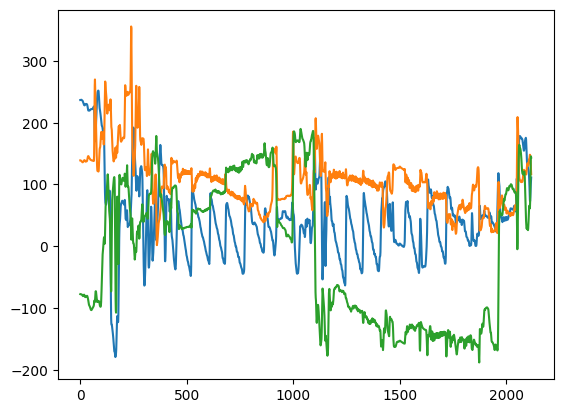

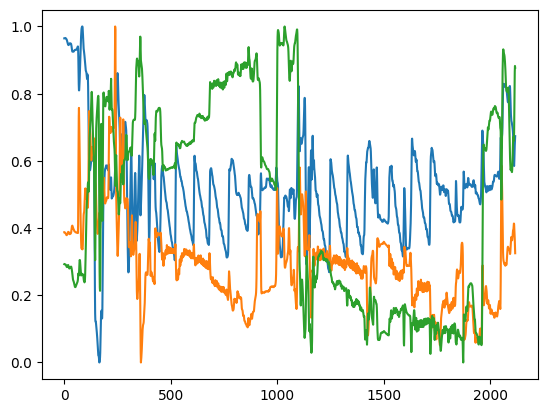

In [5]:
# Load dataset file and generate sequences

# read dataset.csv
Filename = "ID002_filtered_MAF_pos3"
dataSet = pd.read_csv("../Data/OneDrive_1_2022-3-3/Moving average filter/" + Filename + ".csv").to_numpy()
# set axes
all = np.array(dataSet[:,[1,2,3]])
time = np.array(dataSet[:,[0]])

# scale data
t = MinMaxScaler()
figure()
plt.plot(all)
t.fit(all)
all = t.transform(all)

figure()
plt.plot(all)

# convert numpy to tensor
all_data = torch.from_numpy(all)
time_data = torch.from_numpy(time)

# number of input columns
n_inputs = all_data.shape[1]
inputs = all_data.shape[0]
print(n_inputs)
print(inputs)
time_n_inputs = time_data.shape[1]
time_inputs = time_data.shape[0]
print(time_n_inputs)
print(time_inputs)

In [7]:
# Generate sequences
import matplotlib.pyplot as plt

l_min = 14  # the Minimum value
l_interval = 4 # the interval value
l_max = 18  # the Maximum value
saveflag = True
output_all_data = []
for _startIdx in range(0, l_min, l_interval):
  for l_Sequence in range(l_min, l_max + l_interval, l_interval):
    startIdx = _startIdx 
    
    while (startIdx + l_Sequence < inputs):
      #for i in range(0, l_Sequence):
      sequence = all_data[startIdx:startIdx+l_Sequence,:]

      output_all_data.append(np.array(sequence))
      startIdx += round(l_Sequence * (3 / 4))

C:\Users\user\AppData\Local\Temp\ipykernel_18384\956980803.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (5,5));


The number of sequences:  1443


C:\Users\user\AppData\Local\Temp\ipykernel_18384\956980803.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  output_all_data = np.array(output_all_data)


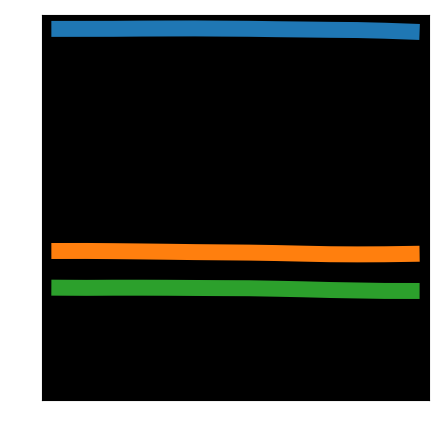

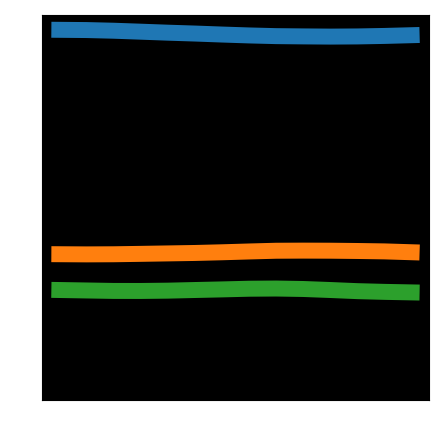

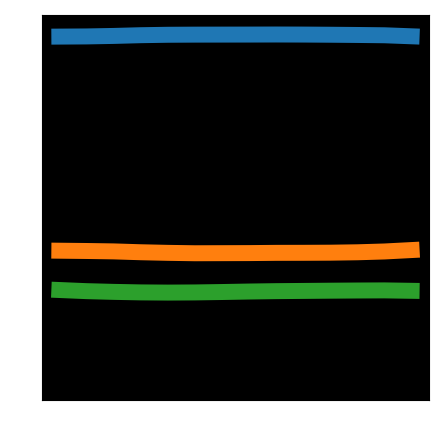

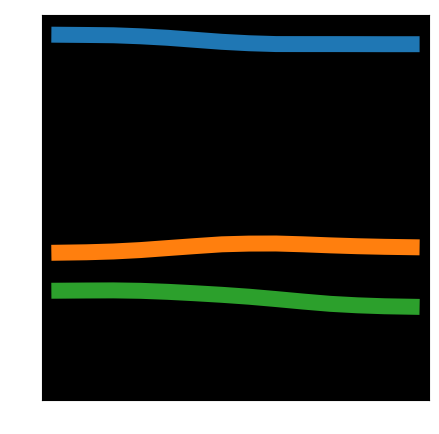

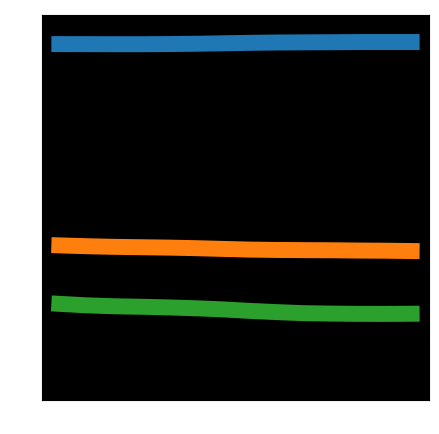

...

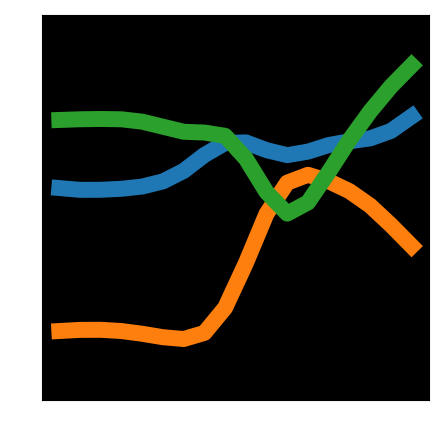

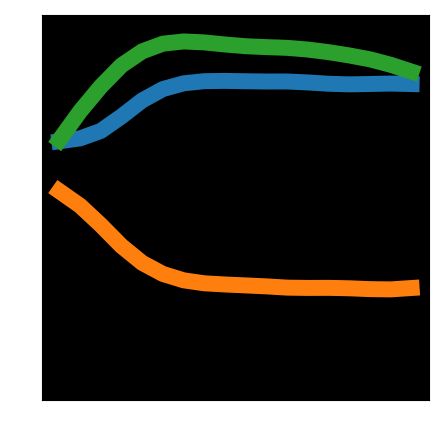

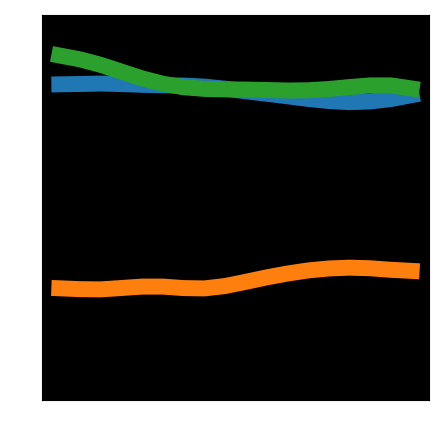

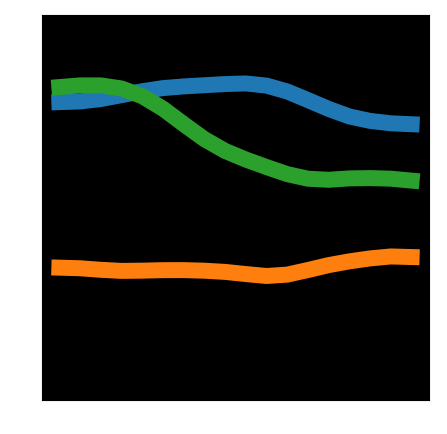

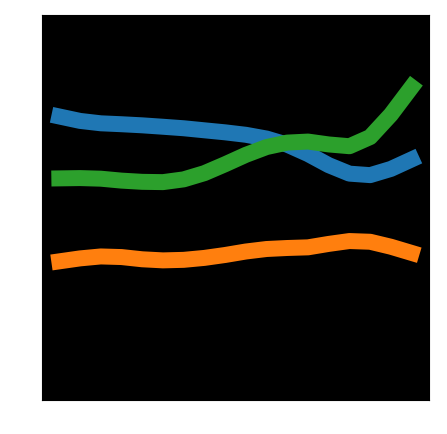

In [8]:
#plot sequences
"""
Change the image background to black by hiding the coordinates of the output 
and making the lines thicker to generate the desired image dataset
"""

for i in range(0,len(output_all_data),1):
  fig = plt.figure(figsize = (5,5));
  temp_array = np.array(output_all_data[i])
  axes = fig.gca()

  axes.set_ylim(0,1)                 
  axes.plot(temp_array,linewidth=11.5)
  axes.patch.set_facecolor("black")                 
  plt.xticks(alpha=0)
  plt.tick_params(axis='x', width=0)
  plt.yticks(alpha=0)
  plt.tick_params(axis='y', width=0)

  if saveflag:
    plt.savefig("./Figures/" + Filename + "_" + str(i) + ".png")


output_all_data = np.array(output_all_data)
print("The number of sequences: ", output_all_data.shape[0])
nbSeq=output_all_data.shape[0] #1443 954 2321 953 498 1436

In [11]:
#load datasets and resize images to RGB images with colour lines

image_w=28
image_h=28

debug=False

array_of_img = [] # this if for store all of the image data
# this function is for read image.
for filename in os.listdir(r'./Figures/'):
        #img is used to store the image data 
        if not filename == ".ipynb_checkpoints":
            img_path = "./Figures/" + filename
            img = cv2.imread(img_path)
            img = img[45:320,45:320] #cut white area in blackground and then resize images to (28,28)
            img = cv2.resize(img, None, fx=image_w/img.shape[0], fy=image_h/img.shape[1])
            if debug:
                plt.imshow(img)
                plt.show()
            img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # make BGR into RGB
            array_of_img.append(img_rgb)

            #print(array_of_img)

image_input = np.array(array_of_img)

#X_train, X_test = train_test_split(image_input, test_size=0.33, random_state=1)
#Splitting the train and test sets, as it does not make sense to divide the data set proportionally for unlabelled data
X_train = image_input
X_test = image_input

In [9]:
#load datasets and resize images to grey images with white lines

image_w=28
image_h=28

array_of_img = [] # this if for store all of the image data
# this function is for read image,the input is directory name.

for filename in os.listdir(r'/content/data/2w/2w black 3/content/Figures/'):
        print(filename) #just for test
        #img is used to store the image data 
        img_path = "/content/data/2w/2w black 3/content/Figures/" + filename
        img = cv2.imread(img_path)
        img = cv2.resize(img, None, fx=image_w/img.shape[0], fy=image_h/img.shape[1])
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY) #convert images to greyscale for analysis
        ret, thresh = cv2.threshold(gray, 0,255, cv2.THRESH_BINARY) # fix the threshold to generate binarized images
        cv2_imshow(thresh)
        array_of_img.append(thresh)

image_input = np.array(array_of_img)


X_train = image_input
X_test = image_input


FileNotFoundError: [WinError 3] 지정된 경로를 찾을 수 없습니다: '/content/data/2w/2w black 3/content/Figures/'

In [12]:
# images nomilization

#normalise 
X_train = X_train.astype('float32') / 255
X_test = X_test.astype('float32') / 255
X_train = np.reshape(X_train, (len(X_train), 28, 28, 3))  # adapt this if using `channels_first` image data format
X_test = np.reshape(X_test, (len(X_test), 28, 28, 3))  # adapt this if using `channels_first` image data format


#gray
#X_train = np.reshape(X_train, (len(X_train), 28, 28, 1))  # adapt this if using `channels_first` image data format
#X_test = np.reshape(X_test, (len(X_test), 28, 28, 1))  # adapt this if using `channels_first` image data format



array([[[[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [0.7254902 , 0.7254902 , 0.7254902 ],
         ...,
         [0.7254902 , 0.7254902 , 0.7254902 ],
         [0.7254902 , 0.7254902 , 0.7254902 ],
         [0.7254902 , 0.7254902 , 0.7254902 ]],

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.12156863, 0.46666667, 0.7058824 ],
         [0.12156863, 0.46666667, 0.7058824 ],
         [0.12156863, 0.46666667, 0.7058824 ]],

        ...,

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]

array([[[[1.00000000e+00, 8.05821992e-01, 1.00000000e+00],
         [9.57588085e-01, 1.00000000e+00, 1.00000000e+00],
         [1.00000000e+00, 1.00000000e+00, 4.34586242e-01],
         ...,
         [4.22934744e-01, 1.00000000e+00, 1.00000000e+00],
         [1.00000000e+00, 8.43318810e-01, 1.00000000e+00],
         [1.00000000e+00, 1.00000000e+00, 1.00000000e+00]],

        [[1.00000000e+00, 7.95834622e-01, 1.00000000e+00],
         [1.00000000e+00, 9.30465501e-01, 8.84507686e-01],
         [1.11094311e-01, 1.00000000e+00, 7.12103285e-01],
         ...,
         [7.95770646e-01, 2.79747061e-01, 7.14280252e-01],
         [7.43481992e-01, 7.60827796e-01, 7.55371920e-01],
         [1.00000000e+00, 6.00416602e-01, 5.42177185e-01]],

        [[1.00000000e+00, 1.00000000e+00, 1.00000000e+00],
         [1.00000000e+00, 6.90603617e-01, 7.23047198e-01],
         [1.02104618e-01, 0.00000000e+00, 2.43786389e-01],
         ...,
         [1.02874696e-01, 4.04943360e-01, 4.05536758e-01],
         [

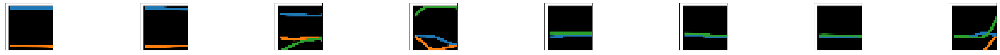

In [13]:
# add noise to test de-noising autoencoder
def noise(array):
    """
    Adds random noise to each image in the supplied array.
    """

    noise_factor = 0.4
    noisy_array = array + noise_factor * np.random.normal(
        loc=0.0, scale=1.0, size=array.shape
    )

    return np.clip(noisy_array, 0.0, 1.0)

noisy_train_data = noise(X_train)
noisy_test_data = noise(X_test)
# Create a copy of the data with added noise
noisy_train_data = noise(X_train)
noisy_test_data = noise(X_test)

# Display the train data and a version of it with added noise
display(X_train, noisy_train_data)

# show generated images and check it
n = 8
plt.figure(figsize=(40, 4))
for i in range(n):
    # display original
    ax = plt.subplot(2, n, i+1)
    plt.imshow((X_train[i]* 255 ).astype(np.uint8))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

In [14]:
#Build AutoEncoder, cnn + flatten
#The encoder part consists of four convolutional layers, which are transformed into one-dimensional data using 'Flatten' operation, and then compressed to 64 dimensions by a fully-connected layer
#The decoder part consists of similar fully-connected layers, which are transformed into three-dimensional data using 'Reshape' operation, and then four similar convolutional layers, resulting in a reconstructed output with the same dimensionality as the input data.
#input
input_img = Input(shape=(28, 28, 3))  

############
# Encoding #
############

# Conv1 #
x = Conv2D(filters = 16, kernel_size = (3, 3), activation='relu', strides=(2, 2), padding='same')(input_img)

# Conv2 #
x = Conv2D(filters = 8, kernel_size = (3, 3), activation='relu', strides=(2, 2), padding='same')(x)

# Conv 3 #
x = Conv2D(filters = 8, kernel_size = (3, 3), activation='relu', strides=(2, 2), padding='same')(x)

# Conv 4 #
x = Conv2D(filters = 8, kernel_size = (3, 3), activation='relu', padding='same')(x)

x = Flatten()(x)  #128
x = Dense(4*4*8, activation='relu')(x)
x = BatchNormalization()(x)
x = Dense(4*4*8/2.0, activation='relu')(x)
x = BatchNormalization()(x)
# bottleneck
n_bottleneck = 4*4*8/2.0
encoded = Dense(n_bottleneck, activation='relu')(x)


############
# Decoding #
############

x = Dense(4*4*8/2.0, activation='relu')(encoded)
x = BatchNormalization()(x)
x = Dense(4*4*8, activation='relu')(x)
x = BatchNormalization()(x)
x = Reshape((4,4,8))(x)

# DeConv1
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

# DeConv2
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

# DeConv3
x = Conv2D(8, (3, 3), activation='relu')(x)
x = UpSampling2D((2, 2))(x)

# DeConv4
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)

#output
decoded = Conv2D(3, (3, 3), activation='relu', padding='same')(x)


# Declare the model
autoencoder = Model(input_img, decoded)
#autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

autoencoder.compile(optimizer='adam', loss='mse')
autoencoder.summary()
plot_model(autoencoder, 'autoencoder_no_compress.png', show_shapes=True) #Generating structural diagrams

#check model layers
for i in range(len(autoencoder.layers)):
  print(autoencoder.get_layer(index=i).output) #0-23 10

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 14, 14, 16)        448       
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 8)           1160      
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 8)           584       
                                                                 
 conv2d_3 (Conv2D)           (None, 4, 4, 8)           584       
                                                                 
 flatten (Flatten)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 128)               16512 

In [16]:
# Load pretrained model
modelfile = "autoencoder.h5"
autoencoder=load_model("./Models/" + autoencoderfile)


Epoch 1/100
121/121 [==============================] - 1s 12ms/step - loss: 0.0061 - val_loss: 0.0050
Epoch 2/100
121/121 [==============================] - 1s 10ms/step - loss: 0.0060 - val_loss: 0.0050
Epoch 3/100
121/121 [==============================] - 1s 10ms/step - loss: 0.0061 - val_loss: 0.0049
Epoch 4/100
121/121 [==============================] - 1s 10ms/step - loss: 0.0061 - val_loss: 0.0050
Epoch 5/100
121/121 [==============================] - 1s 10ms/step - loss: 0.0064 - val_loss: 0.0052
Epoch 6/100
121/121 [==============================] - 1s 10ms/step - loss: 0.0059 - val_loss: 0.0048
Epoch 7/100
121/121 [==============================] - 1s 10ms/step - loss: 0.0060 - val_loss: 0.0048
Epoch 8/100
121/121 [==============================] - 1s 10ms/step - loss: 0.0061 - val_loss: 0.0051
Epoch 9/100
121/121 [==============================] - 1s 10ms/step - loss: 0.0060 - val_loss: 0.0049
Epoch 10/100
121/121 [==============================] - 1s 11ms/step - loss: 0.006

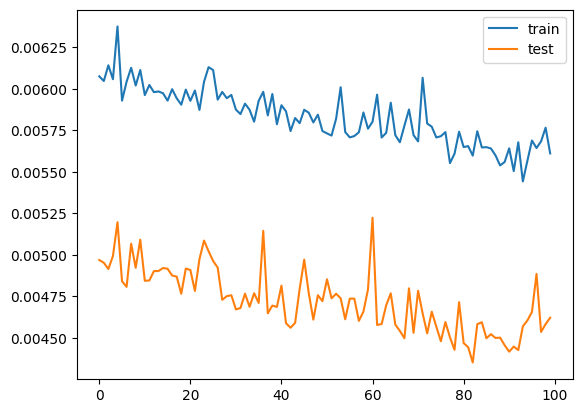

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [19]:
# train model and save it
# fit the autoencoder model to reconstruct input
history = autoencoder.fit(X_train, X_train, epochs=100, batch_size=12, shuffle=True, validation_data=(X_test,X_test))
# plot evaluation results
score = autoencoder.evaluate(X_train, X_train, batch_size=12)
print("score:" ,score)

figure(4)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

# save model
autoencoder.save('./Models/' + autoencoderfile)

# define an encoder model (without the decoder)
encoder = Model(inputs=input_img, outputs=encoded)
# plot the encoder strcture
plot_model(encoder, 'encoder_no_compress.png', show_shapes=True)
# save the encoder to file
encoder.save('./Models/' + encoderfile)

# define an decoder model (without the encoder)
decoder = Model(inputs=encoded, outputs=decoded)
# plot the encoder strcture
plot_model(decoder, 'decoder_no_compress.png', show_shapes=True)
# save the encoder to file
decoder.save('./Models/' + decoderfile)

46/46 [==============================] - 0s 4ms/step
tested images: 
[859, 487, 256, 1189, 871]


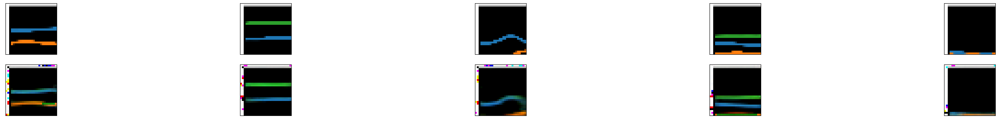

In [27]:
# test decode results and original image
decoded_imgs = autoencoder.predict(X_test)


n = 5

plt.figure(figsize=(40, 4))

test_samples=random.sample(range(0,len(X_test)-1),n)
print("tested images: ")
print(test_samples)
for i in range(n):

    # display original
    ax = plt.subplot(2, n, i +1)
    #plt.imshow(X_test[i].reshape(28,28))
    plt.imshow((X_test[test_samples[i]]* 255 ).astype(np.uint8))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n, i+1+n)
    plt.imshow((decoded_imgs[test_samples[i]]* 255).astype(np.uint8))
    #plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()